In [21]:
def SDCTD_stevilo(g): #osnovna funkcija
    h = g.complement()

    p = MixedIntegerLinearProgram(maximization = False)
    x = p.new_variable(binary = True)
    p.set_objective(sum([x[v] for v in g]))

    for v in g.vertices():
        neighbors = g.neighbors(v)  
        p.add_constraint(x[v] + sum(x[w] for w in neighbors) >= 1)

    zaustavi = False

    for v in g.vertices():
        neighbors_complement = h.neighbors(v)  
        if neighbors_complement:  
            p.add_constraint(sum(x[w] for w in neighbors_complement) >= 1)

        else: 
            zaustavi = True
            break 

    if not zaustavi == True:
        p.solve()
        x = p.get_values(x)
        return(sum(1 for i in x.values() if i == 1))
    else:
        return None

In [8]:
#za majhne grafe
def vsota(g): #funkcija ki izracuna vsoto dom. stevil za ustrezne grafe
    h = g.complement()
    if SDCTD_stevilo(g) is not None and SDCTD_stevilo(h) is not None:
        return SDCTD_stevilo(g) + SDCTD_stevilo(h)
    return None

def SDCTD_vsota(n):
    i = n
    vsi_grafi = [G for G in graphs.nauty_geng(f"{i} -c")] #obravnavamo le povezane grafe
    
    seznam_vsot = []  # seznam s SDCTD števili
    ustrezni_grafi = []  # seznam z grafi

    for g in vsi_grafi:
        stevilo = None  # najprej None
        h = g.complement()
        if SDCTD_stevilo(h) is not None:
            stevilo = vsota(g)
        
            if stevilo is not None:
                seznam_vsot.append(stevilo)
                ustrezni_grafi.append(g)
    
    if not ustrezni_grafi: #preverimo ce sploh so okej grafi
        print("Ne obstajajo grafi s SDCTD številom")
        return None  

    max_vsota = max(seznam_vsot) #ustrezen ekstrem stevil
    min_vsota = min(seznam_vsot)

    max_vsota_grafi = [ustrezni_grafi[i] for i in range(len(ustrezni_grafi)) if seznam_vsot[i] == max_vsota] #najbolj primeren graf
    min_vsota_grafi = [ustrezni_grafi[i] for i in range(len(ustrezni_grafi)) if seznam_vsot[i] == min_vsota]
    
    print(f"Grafi z max vsoto SDCTD števil ({max_vsota}):") #prikazemo vse grafe
    for g in max_vsota_grafi:
        g.show()
        g.complement().show()
    
    print(f"Grafi z min vsoto SDCTD števil ({min_vsota}):")
    for g in min_vsota_grafi:
        g.show()
        g.complement().show()


In [25]:
from random import random, choice
from math import exp

def vsota(g):  # funkcija od prej
    h = g.complement()
    if SDCTD_stevilo(g) is not None and SDCTD_stevilo(h) is not None:
        return SDCTD_stevilo(g) + SDCTD_stevilo(h)
    return None

def SDCTD_vsota_max(n, zacetna_temperatura=100, zmanjsanje=0.99):
    # Ustvari naključni graf z n vozlišči
    G = graphs.RandomGNP(n, 0.5)
    max_vsota_stevilo = vsota(G) #prvotna max vsota
    najboljsi_graf = G.copy() if max_vsota_stevilo is not None else None

    def spremenipovezavo(G): #spreminjamo povezave v grafu
        edges = G.edges(labels=False)
        non_edges = [(u, v) for u in G.vertices() for v in G.vertices() if u < v and not G.has_edge(u, v)]
        H = G.copy()

        if edges and non_edges:
            if choice([True, False]):  # 50% verjetnost za odstranitev
                edge_odstrani = choice(edges)
                H.delete_edge(edge_odstrani)
            else:  # 50% verjetnost za dodajanje
                edge_dodaj = choice(non_edges)
                H.add_edge(edge_dodaj)
        elif edges:
            edge_odstrani = choice(edges)
            H.delete_edge(edge_odstrani)
        elif non_edges:
            edge_dodaj = choice(non_edges)
            H.add_edge(edge_dodaj)

        return H

    t = zacetna_temperatura #zacnemo s simulated annealing

    for i in range(1000): #izkaze se da je ta princip veliko boljsi kot tisti, ki sem ga uporabil pri 1. tocki, rabimo zelo malo iteracij
        H = spremenipovezavo(G)
        if not H.is_connected(): # ce ni povezan ga preskocimo
            continue

        nova_vsota = vsota(H)
        if nova_vsota is not None:
            delta = nova_vsota - max_vsota_stevilo

            # Sprejemanje slabših rešitev z verjetnostjo odvisno od temperature
            if delta > 0 or random() < exp(delta / t):
                G = H  # Sprejmi novo stanje
                max_vsota_stevilo = nova_vsota

                # Posodobi najboljši graf
                if najboljsi_graf is None or nova_vsota > vsota(najboljsi_graf):
                    najboljsi_graf = G.copy()

        # Postopno zmanjsanje temperature
        t *= zmanjsanje

    if najboljsi_graf is not None: #izrisemo graf in njegov komplement
        najboljsi_graf.show()
        najboljsi_graf.complement().show()
    else:
        print("Ni bilo mogoče najti veljavnega grafa.")

    return max_vsota_stevilo


In [19]:
from random import random, choice
from math import exp

def vsota(g):  # Funkcija od prej
    h = g.complement()
    if SDCTD_stevilo(g) is not None and SDCTD_stevilo(h) is not None:
        return SDCTD_stevilo(g) + SDCTD_stevilo(h)
    return None

def SDCTD_vsota_min(n, zacetna_temperatura=100, zmanjsanje=0.99):
    # Ustvari naključni graf z n vozlišči
    G = graphs.RandomGNP(n, 0.5)
    min_vsota_stevilo = vsota(G)
    najboljsi_graf = G.copy() if min_vsota_stevilo is not None else None

    def spremenipovezavo(G): #spreminjanje povezav
        edges = G.edges(labels=False)
        non_edges = [(u, v) for u in G.vertices() for v in G.vertices() if u < v and not G.has_edge(u, v)]
        H = G.copy()

        if edges and non_edges:
            if choice([True, False]):
                edge_odstrani = choice(edges)
                H.delete_edge(edge_odstrani)
            else:
                edge_dodaj = choice(non_edges)
                H.add_edge(edge_dodaj)
        elif edges:
            edge_odstrani = choice(edges)
            H.delete_edge(edge_odstrani)
        elif non_edges:
            edge_dodaj = choice(non_edges)
            H.add_edge(edge_dodaj)

        return H

    t = zacetna_temperatura #simulated annealing, podobno kot pri max, le da sedaj zelimo cim manjse stevilo

    for i in range(1000):
        H = spremenipovezavo(G)
        if not H.is_connected():
            continue

        nova_vsota = vsota(H)
        if nova_vsota is not None:
            delta = min_vsota_stevilo - nova_vsota
            
            if delta > 0 or random() < exp(delta / t):
                G = H
                min_vsota_stevilo = nova_vsota
                
                if najboljsi_graf is None or nova_vsota < vsota(najboljsi_graf):
                    najboljsi_graf = G.copy()

        t *= zmanjsanje

    if najboljsi_graf is not None: #izrisemo graf in njegov komplement
        najboljsi_graf.show()
        najboljsi_graf.complement().show()
    else:
        print("Ni bilo mogoče najti veljavnega grafa.")

    return min_vsota_stevilo



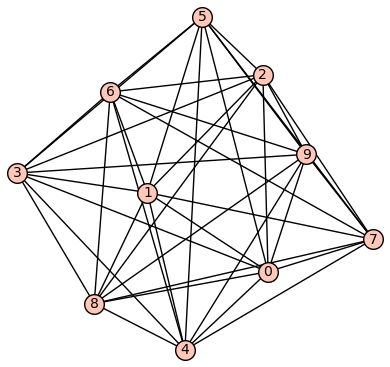

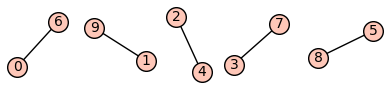

15


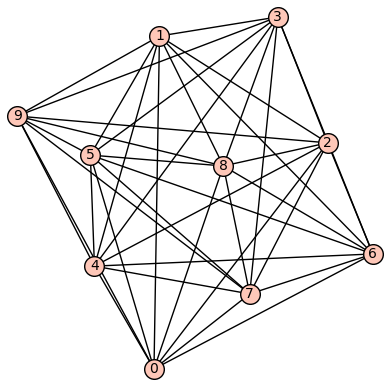

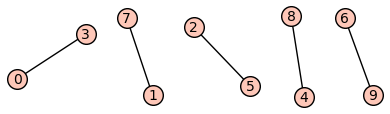

15


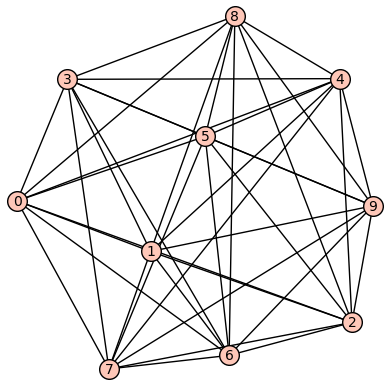

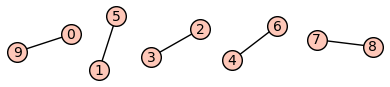

15


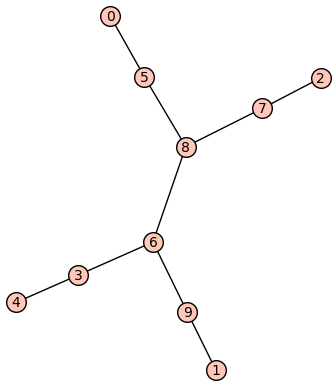

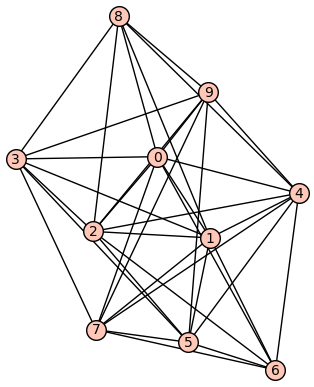

10


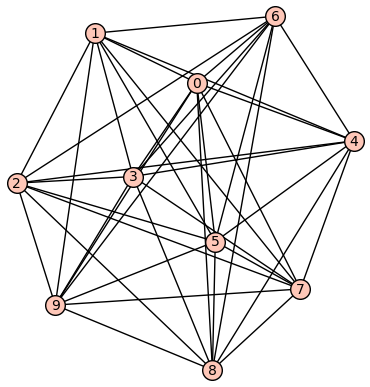

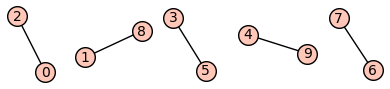

15


In [26]:
for i in range(5): #upostevamo le najvecje stevilo
    print(SDCTD_vsota_max(10))

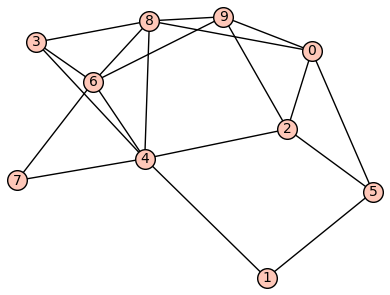

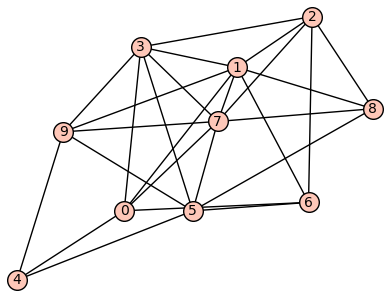

4


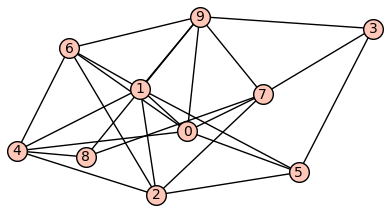

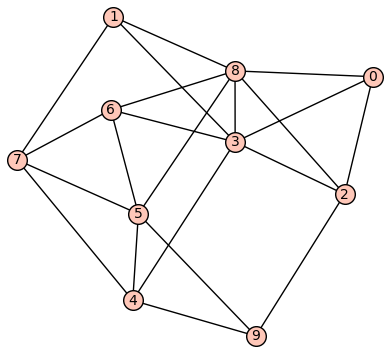

4


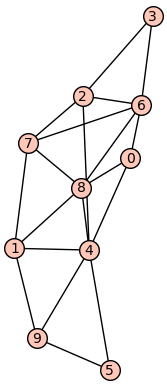

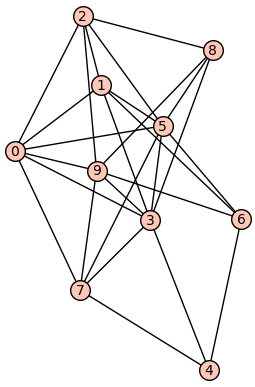

4


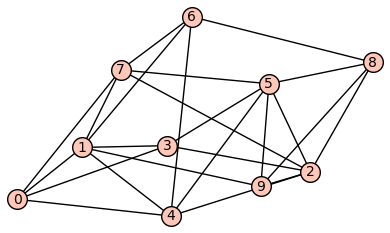

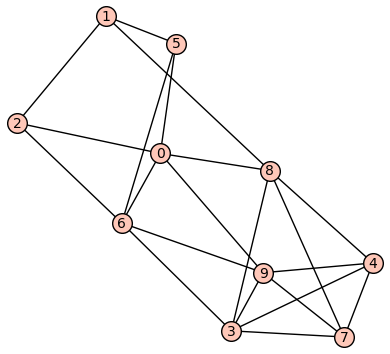

4


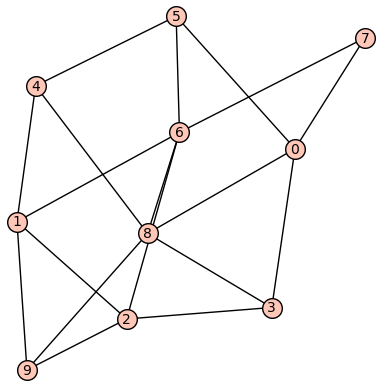

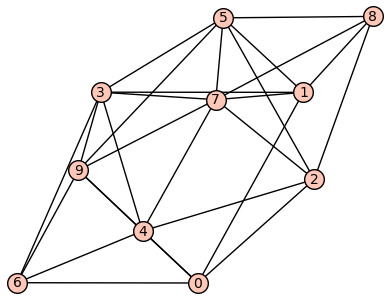

4


In [27]:
for i in range(5): #upostevamo najmanjse stevilo
    print(SDCTD_vsota_min(10))

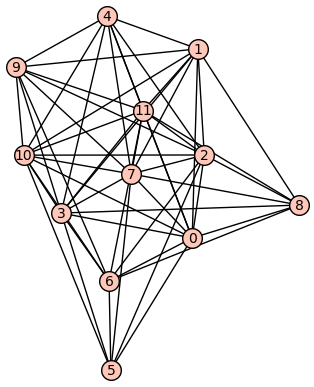

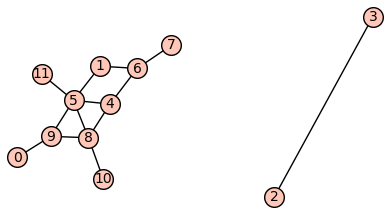

12


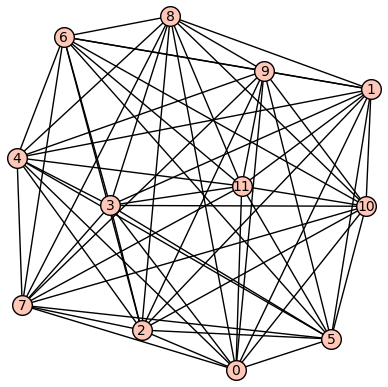

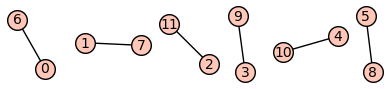

18


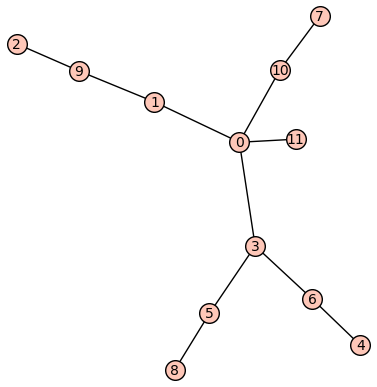

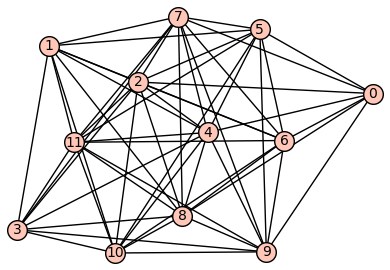

12


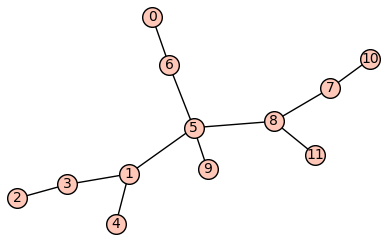

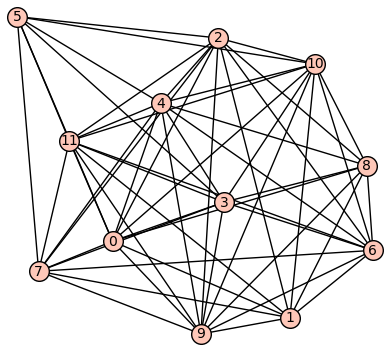

12


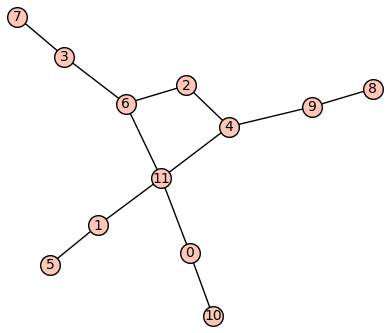

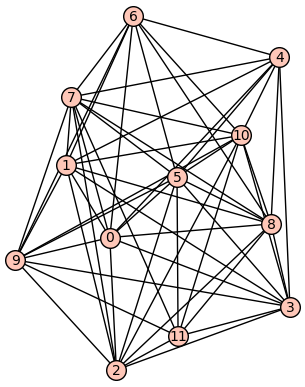

12


In [29]:
for i in range(5):
    print(SDCTD_vsota_max(12))

Grafi z max vsoto SDCTD števil (9):


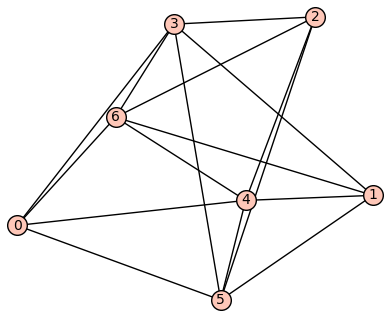

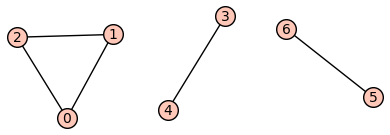

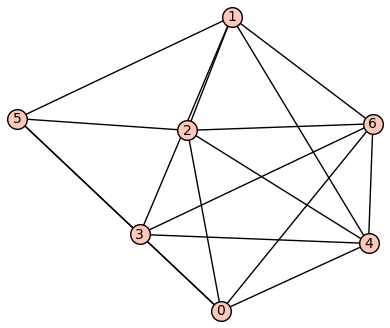

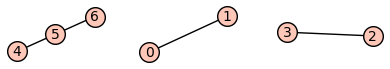

Grafi z min vsoto SDCTD števil (4):


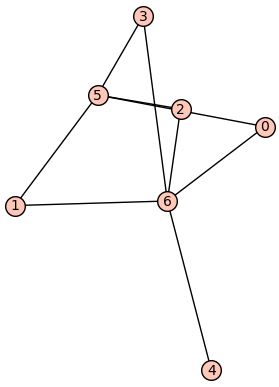

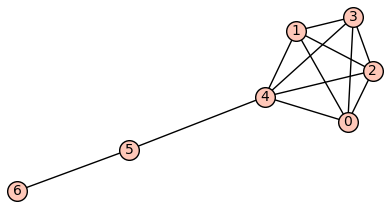

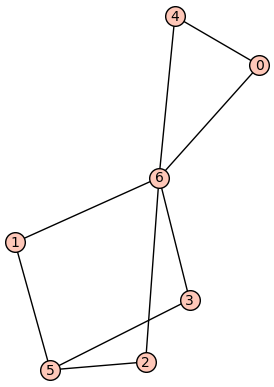

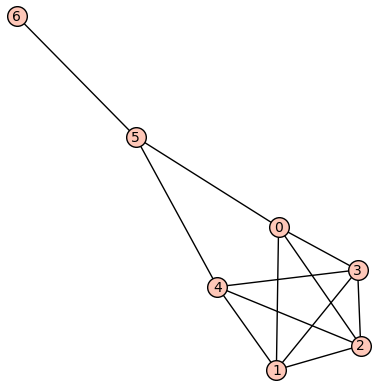

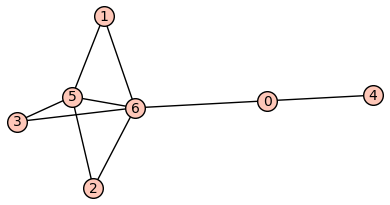

...

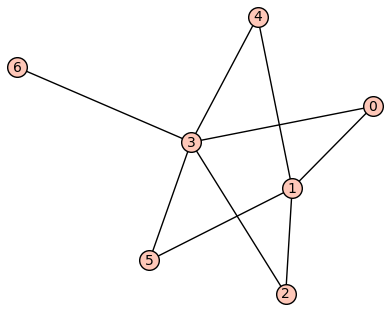

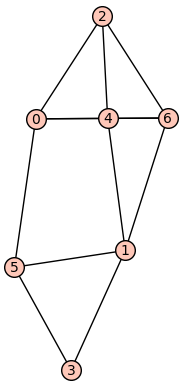

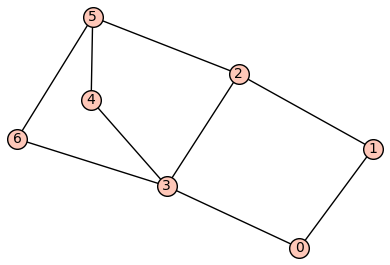

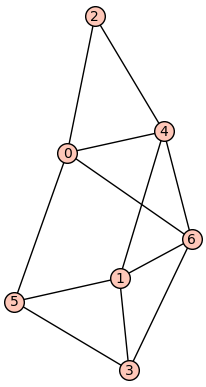

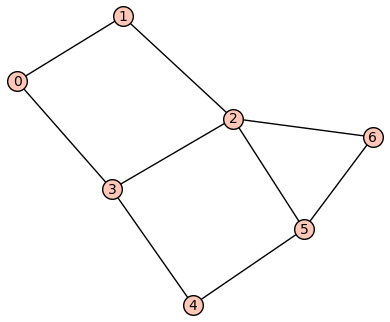

In [8]:
SDCTD_vsota(7)

Grafi z max vsoto SDCTD števil (9):


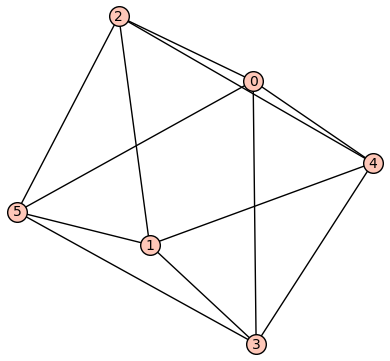

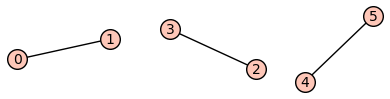

Grafi z min vsoto SDCTD števil (4):


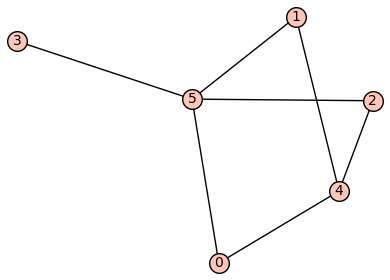

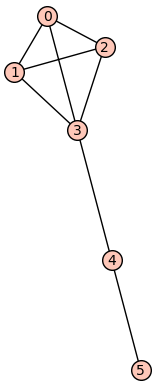

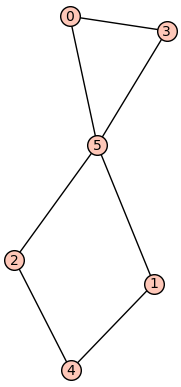

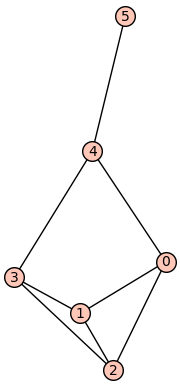

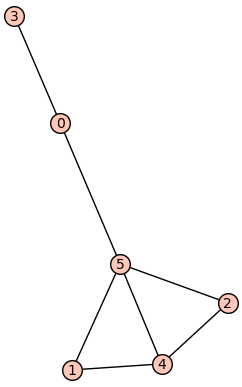

...

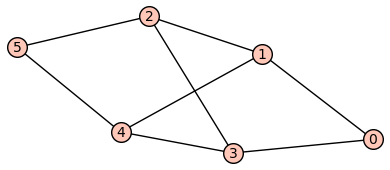

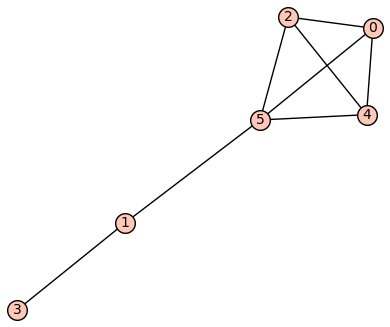

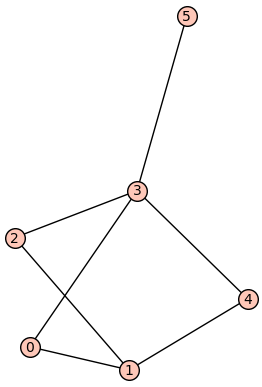

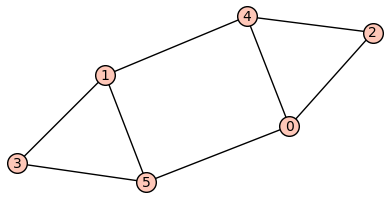

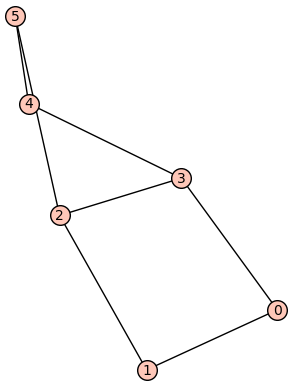

In [10]:
SDCTD_vsota(6)

Grafi z max vsoto SDCTD števil (9):


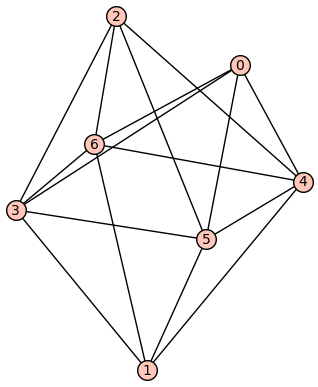

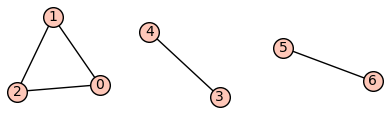

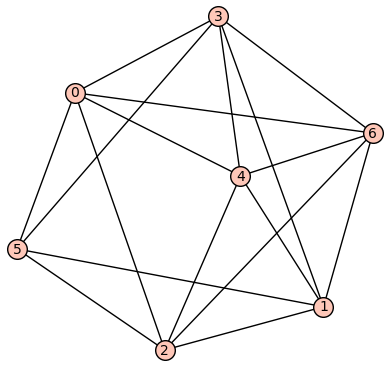

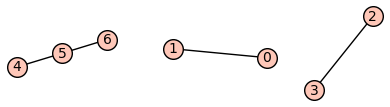

Grafi z min vsoto SDCTD števil (4):


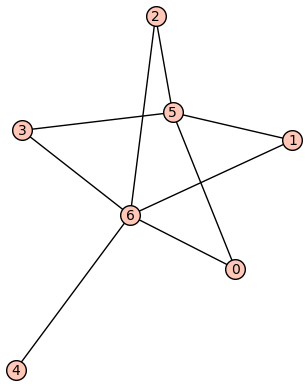

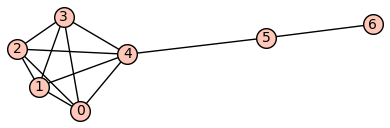

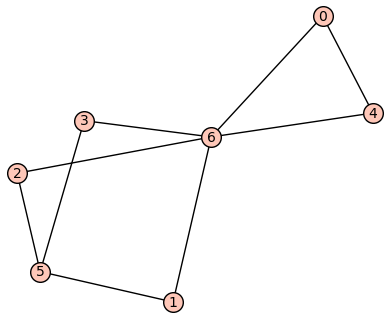

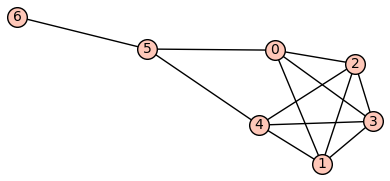

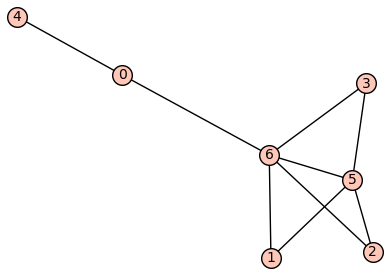

...

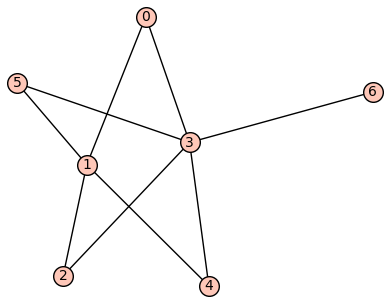

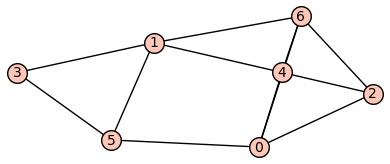

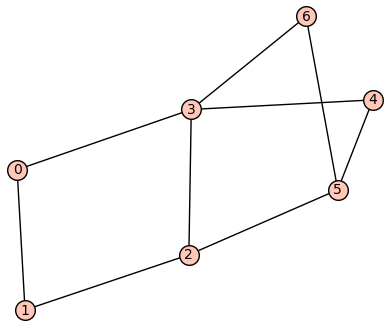

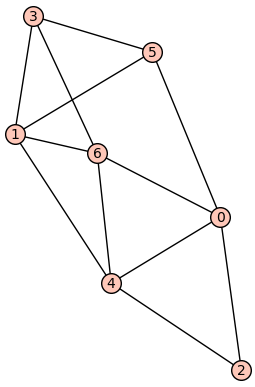

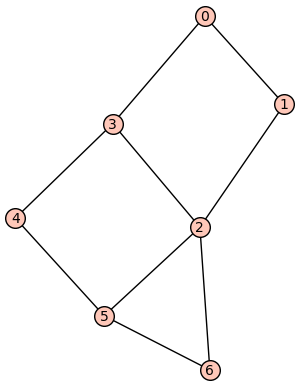

In [11]:
SDCTD_vsota(7)

Grafi z max vsoto SDCTD števil (12):


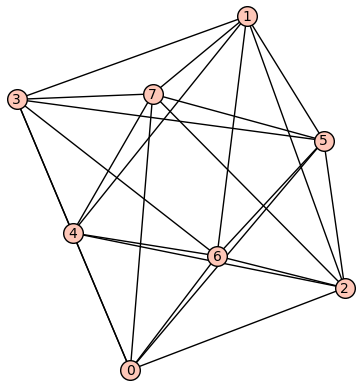

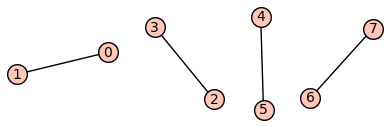

Grafi z min vsoto SDCTD števil (4):


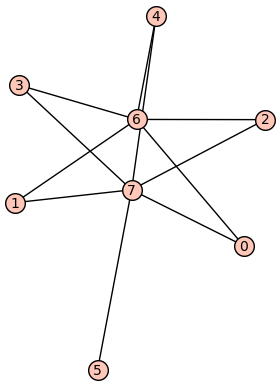

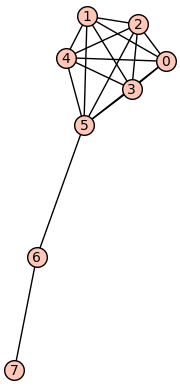

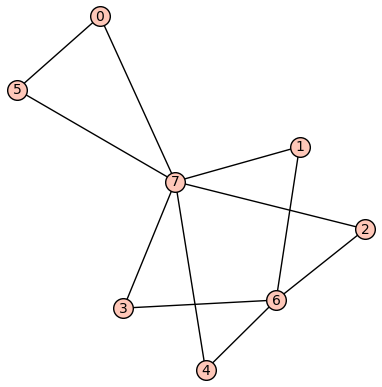

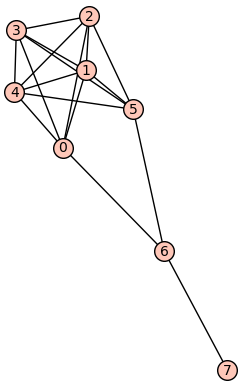

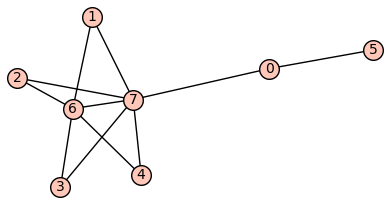

...

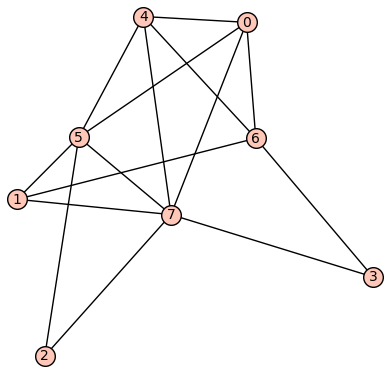

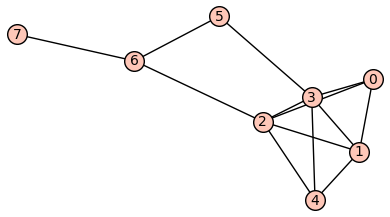

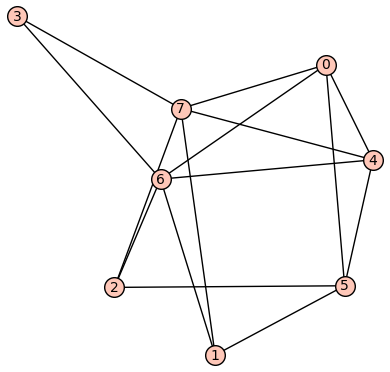

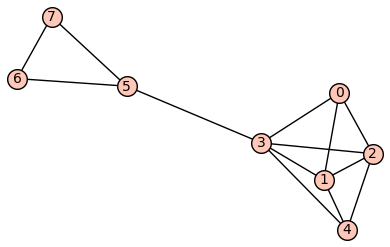

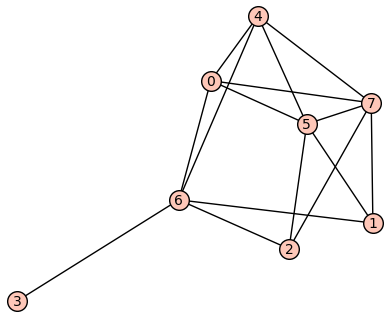

In [5]:
SDCTD_vsota(8)

In [11]:
SDCTD_vsota_random2(10)

NameError: name 'SDCTD_stevilo2' is not defined